<a href="https://colab.research.google.com/github/Ghilba812/Mapidtask/blob/main/6_Trend_STL_VTK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

$\Large\color{blue}{\text{PyGMTSAR SBAS Analysis}}$

### Look for more PyGMTSAR examples:

* Google Colab - see GitHub page for [notebooks](https://github.com/mobigroup/gmtsar),

* Docker Images on [DockerHub](https://hub.docker.com/r/mobigroup/pygmtsar),

* GitHub [notebooks](https://github.com/mobigroup/gmtsar/tree/master/notebooks),

* GitHub Actions [console scripts](https://github.com/mobigroup/gmtsar/actions),

* Google Cloud VM -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/),

* Linux Debian and Ubuntu -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/),

* Apple Silicon and Intel hosts -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/).


### PyGMTSAR InSAR library, Geomed3D Geophysical Inversion Library, N-Cube 3D/4D GIS Data Visualization, etc. are my free-time Open Source projects.

I have STEM master’s degree in radio physics and in 2004 I have got the first prize of the All-Russian Physics competition for significant results in forward and inverse modeling for non-linear optics and holography, also applicable for modeling of Gravity, Magnetic, and Thermal fields and satellite interferometry processing. And I’m data scientist and software developer with 20 year’s experience in science and industrial development. I had been working on government contracts and universities projects and on projects for LG Corp, Google Inc, etc.

### You can sponsor my work on [Patreon](https://www.patreon.com/pechnikov) where I share my projects updates, publications, use cases, examples, and other useful information. To order some research and development and support, see my profile on freelance platform [Upwork](https://www.upwork.com/freelancers/~01e65e8e7221758623).

### Resources

* [Patreon](https://www.patreon.com/pechnikov),

* [YouTube Geological Models](https://www.youtube.com/channel/UCSEeXKAn9f_bDiTjT6l87Lg),

* [Virtual and Augmented Reality (VR/AR) Geological Models](https://mobigroup.github.io/ParaView-Blender-AR/),

* [GitHub](https://github.com/mobigroup),

* [LinkedIn](https://www.linkedin.com/in/alexey-pechnikov/),

* [Medium](https://medium.com/@pechnikov),

* [Habr](https://habr.com/ru/users/N-Cube/posts/).

### @ Alexey Pechnikov, 2023

## Load Modules to Check Environment

In [ ]:
import platform, sys, os

## Load and Setup Python Modules

In [ ]:
import xarray as xr
import numpy as np
import dask
import pandas as pd
import geopandas as gpd
import shapely
import json
import scipy.signal
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# plotting modules
import hvplot.pandas  # noqa
import hvplot.xarray  # noqa
import holoviews as hv
pd.options.plotting.backend = 'hvplot'
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

In [ ]:
# define Pandas display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

## Load Custom Python Modules

In [ ]:
# import the top level class
from pygmtsar import SBAS
# show progress indicator for the long operations
from pygmtsar import tqdm_dask
# for lazy operations
import dask

## Define Custom Functions

In [ ]:
# the code adopted from my project https://github.com/mobigroup/ParaView-plugins
class NCubeVTK:
    @staticmethod
    def ImageOnTopography(dataset, band_mask=None, use_sealevel=False):
        from vtk import vtkPoints, vtkStructuredGrid, vtkThreshold, vtkDataObject, \
            VTK_FLOAT, VTK_UNSIGNED_CHAR, vtkStringArray, vtkFloatArray, vtkIntArray
        from vtk.util import numpy_support as vn
        import numpy as np
        import xarray as xr
        # https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
        #import rioxarray as rio

        if band_mask is not None:
            if band_mask not in dataset.data_vars:
                print (f'ERROR: {band_mask} variable not found')
                return
            #if 'band' not in dataset[band_mask].dims:
            #    print (f'ERROR: {band_mask} variable has no band dimension')
            #    return

        if not isinstance(dataset, xr.Dataset):
            print ('ERROR: Unsupported ds argument, should be supported file name or Xarray Dataset')
            return

        # fill NODATA by NAN
        for data_var in dataset.data_vars:
            if dataset[data_var].values.dtype in [np.dtype('float16'),np.dtype('float32'),np.dtype('float64')]:
                dataset[data_var].values = dataset[data_var].values.astype('float32')
                if '_FillValue' in dataset[data_var] and not np.isnan(dataset[data_var]._FillValue):
                    dataset[data_var].values[dataset[data_var].values == dataset[data_var]._FillValue] = np.nan

        xs = dataset.x.values
        ys = dataset.y.values
        (yy,xx) = np.meshgrid(ys, xs)
        if 'z' in dataset:
            zs = dataset.z.values
            znanmask = np.isnan(dataset.z)
            # replace negative topography by sea level (z=0)
            if use_sealevel:
                zs[zs <= 0] = 0
        else:
            # set z coordinate to zero
            zs = np.zeros_like(xx)
            znanmask = 0

        # create raster mask by geometry and for NaNs
        vtk_points = vtkPoints()
        points = np.column_stack((xx.ravel('F'), yy.ravel('F'), zs.ravel('C')))
        vtk_points.SetData(vn.numpy_to_vtk(points, deep=True))

        sgrid = vtkStructuredGrid()
        sgrid.SetDimensions(len(xs), len(ys), 1)
        sgrid.SetPoints(vtk_points)

        for data_var in dataset.data_vars:
            if 'z' == data_var:
                # variable is already included into coordinates
                continue
            da = dataset[data_var]
            dims = da.dims
            #print (data_var, dims, da.dtype)
            if 'band'in dims:
                bands = da.band.shape[0]
                #print ('bands', bands)
                if bands in [3,4]:
                    # RGB or RGBA, select 3 bands only
                    array = vn.numpy_to_vtk(da[:3].values.reshape(3,-1).T, deep=True, array_type=VTK_UNSIGNED_CHAR)
                    array.SetName(da.name)
                    sgrid.GetPointData().AddArray(array)
                elif bands == 1:
                    array = vn.numpy_to_vtk(da.values.reshape(1,-1).T, deep=True, array_type=VTK_FLOAT)
                    array.SetName(da.name)
                    sgrid.GetPointData().AddArray(array)
                else:
                    print (f'ERROR: Unsupported bands count (should be 1,3 or 4) {bands} for variable {data_var}')
                    return
            else:
                array = vn.numpy_to_vtk(da.values.ravel(), deep=True, array_type=VTK_FLOAT)
                array.SetName(da.name)
                sgrid.GetPointData().AddArray(array)

        if band_mask is not None and 'band' in dataset[band_mask]:
            # mask NaNs for band variable
            nanmask = np.any(np.isnan(dataset[band_mask]),axis=0)
            # mask zero areas for color bands
            # a bit of magic to enhance image (mask single channel zeroes)
            # that's more correct way, only totally black pixels ignored
            #zeromask = (~np.all(image.values==0,axis=0)).astype(float)
            # that's a magic for better borders
            zeromask = np.any(ds[band_mask].values==0,axis=0)
            mask = nanmask | zeromask | znanmask
        elif band_mask is not None:
            # mask NaNs
            nanmask = np.isnan(dataset[band_mask])
            mask = nanmask | znanmask
        else:
            mask = znanmask

        array = vn.numpy_to_vtk(mask.values.ravel(), deep=True, array_type=VTK_UNSIGNED_CHAR)
        array.SetName('band_mask')
        sgrid.GetPointData().AddArray(array)

        for coord in dataset.coords:
            #print (coord, dataset[coord].dims, len(dataset[coord].dims))
            if len(dataset[coord].dims) > 0:
                # real coordinate, ignore it
                continue
            #print (coord, dataset[coord].dtype)
            #print ('np.datetime64', np.issubdtype(dataset[coord].dtype, np.datetime64))
            #print ('np.int64', np.issubdtype(dataset[coord].dtype, np.int64))
            #print ('np.float64', np.issubdtype(dataset[coord].dtype, np.float64))
            if np.issubdtype(dataset[coord].dtype, np.datetime64):
                data_array = vtkStringArray()
                data_value = str(dataset[coord].values)
            elif np.issubdtype(dataset[coord].dtype, np.int64):
                data_array = vtkIntArray()
                data_value = dataset[coord].values.astype(np.int64)
            elif np.issubdtype(dataset[coord].dtype, np.float64):
                data_array = vtkFloatArray
                data_value = dataset[coord].values.astype(np.float64)
            else:
                print(f'NOTE: unsupported attribute {coord} datatype {dataset[coord].dtype}, miss it')
                continue
            data_array.SetName(coord)
            data_array.InsertNextValue(data_value)
            sgrid.GetFieldData().AddArray(data_array)

        thresh = vtkThreshold()
        thresh.SetInputData(sgrid)
        thresh.SetInputArrayToProcess(0, 0, 0, vtkDataObject.FIELD_ASSOCIATION_POINTS, "band_mask")
        # drop float NANs
        #thresh.SetLowerThreshold(-1e30)
        #thresh.SetUpperThreshold(1e30)
        thresh.SetUpperThreshold(0)
        thresh.Update()
        ugrid = thresh.GetOutput()
        # remove internal mask variable from output
        ugrid.GetPointData().RemoveArray('band_mask')
        return ugrid

#vtk_ugrid = NCubeVTK.ImageOnTopography(ds)
#pv.UnstructuredGrid(vtk_ugrid)

## Define Processing Parameters

In [ ]:
ORBIT     = 'D'
WORKDIR   = 'raw_asc' if ORBIT == 'A' else 'raw_desc'

## Run Local Dask Cluster

For multicore processing of the all big rasters launch Dask cluster

In [ ]:
from dask.distributed import Client
if 'client' in globals():
    client.close()
client = Client()
# for some reason the code below uses 4 cores only using Client()
# define the configuration manually (Apple Silicon 4+4 cores)
# client = Client(n_workers=8, threads_per_worker=1)
client

2023-05-09 12:50:31,742 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/r9/myjqk4417vsbrknw1cnwld780000gn/T/dask-worker-space/worker-t0ghfzwl', purging
2023-05-09 12:50:31,743 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/r9/myjqk4417vsbrknw1cnwld780000gn/T/dask-worker-space/worker-pp8zpkyk', purging


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 16.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:59226,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 16.00 GiB
Comm: tcp://127.0.0.1:59238,Total threads: 2
Dashboard: http://127.0.0.1:59242/status,Memory: 4.00 GiB
Nanny: tcp://127.0.0.1:59229,


## Restore SBAS

In [ ]:
sbas = SBAS.restore(WORKDIR)

NOTE: load state from file raw_desc/SBAS.pickle


In [ ]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-01-11,2020-01-11 01:38:59,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200111t013859-20200111t013905-030746-038675-005.tiff,backup_desc/s1a-iw2-slc-vv-20200111t013859-20200111t013905-030746-038675-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210316T213321_V20200110T225942_20200112T005942.EOF,"POLYGON ((67.12046 39.81691, 66.06362 40.06598, 65.64501 38.28974, 66.70185 38.04067, 67.12046 39.81691))"
2020-01-23,2020-01-23 01:38:59,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200123t013859-20200123t013905-030921-038c9b-005.tiff,backup_desc/s1a-iw2-slc-vv-20200123t013859-20200123t013905-030921-038c9b-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210317T012342_V20200122T225942_20200124T005942.EOF,"POLYGON ((67.12071 39.81634, 66.06390 40.06541, 65.64528 38.28918, 66.70208 38.04011, 67.12071 39.81634))"
2020-02-04,2020-02-04 01:38:59,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200204t013859-20200204t013905-031096-0392c3-005.tiff,backup_desc/s1a-iw2-slc-vv-20200204t013859-20200204t013905-031096-0392c3-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210317T051531_V20200203T225942_20200205T005942.EOF,"POLYGON ((67.12072 39.81658, 66.06717 40.06695, 65.68428 38.45575, 66.73782 38.20538, 67.12072 39.81658))"
2020-02-16,2020-02-16 01:38:58,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200216t013858-20200216t013904-031271-0398cd-005.tiff,backup_desc/s1a-iw2-slc-vv-20200216t013858-20200216t013904-031271-0398cd-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210317T090821_V20200215T225942_20200217T005942.EOF,"POLYGON ((67.12097 39.81632, 66.06747 40.06670, 65.68458 38.45562, 66.73808 38.20524, 67.12097 39.81632))"
2020-02-28,2020-02-28 01:38:58,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200228t013858-20200228t013904-031446-039ed0-005.tiff,backup_desc/s1a-iw2-slc-vv-20200228t013858-20200228t013904-031446-039ed0-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210317T125938_V20200227T225942_20200229T005942.EOF,"POLYGON ((67.12052 39.81648, 66.06702 40.06682, 65.68409 38.45538, 66.73759 38.20504, 67.12052 39.81648))"
2020-03-11,2020-03-11 01:38:58,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200311t013858-20200311t013904-031621-03a4e4-005.tiff,backup_desc/s1a-iw2-slc-vv-20200311t013858-20200311t013904-031621-03a4e4-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210317T164344_V20200310T225942_20200312T005942.EOF,"POLYGON ((67.11866 39.81677, 66.06520 40.06708, 65.68228 38.45552, 66.73574 38.20521, 67.11866 39.81677))"
2020-03-23,2020-03-23 01:38:58,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200323t013858-20200323t013904-031796-03ab0d-005.tiff,backup_desc/s1a-iw2-slc-vv-20200323t013858-20200323t013904-031796-03ab0d-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210317T202609_V20200322T225942_20200324T005942.EOF,"POLYGON ((67.11831 39.81641, 66.06489 40.06670, 65.68204 38.45538, 66.73546 38.20509, 67.11831 39.81641))"
2020-04-04,2020-04-04 01:38:59,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200404t013859-20200404t013905-031971-03b134-005.tiff,backup_desc/s1a-iw2-slc-vv-20200404t013859-20200404t013905-031971-03b134-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210318T001647_V20200403T225942_20200405T005942.EOF,"POLYGON ((67.11893 39.81627, 66.06556 40.06656, 65.68273 38.45536, 66.73610 38.20508, 67.11893 39.81627))"
2020-04-16,2020-04-16 01:38:59,D,S1A,VV,2,backup_desc/s1a-iw2-slc-vv-20200416t013859-20200416t013905-032146-03b75d-005.tiff,backup_desc/s1a-iw2-slc-vv-20200416t013859-20200416t013905-032146-03b75d-005.xml,backup_desc/S1A_OPER_AUX_POEORB_OPOD_20210318T040917_V20200415T225942_20200417T005942.EOF,"POLYGON ((67.11999 39.81600, 66.06656 40.06631, 65.68371 38.45513, 66.73713 38.20481, 67.11999 39.81600))"


## Find SBAS Pairs and Dates

Scan work directory to find all the processed pairs

In [ ]:
pairs, dates = sbas.pairs(dates=True)
pairs

,ref,rep,duration
0,2020-01-11,2020-01-23,12
1,2020-01-11,2020-02-04,24
2,2020-01-11,2020-02-16,36
3,2020-01-11,2020-02-28,48
4,2020-01-23,2020-02-04,12
5,2020-01-23,2020-02-16,24
6,2020-01-23,2020-02-28,36
7,2020-01-23,2020-03-11,48
8,2020-02-04,2020-02-16,12
9,2020-02-04,2020-02-28,24


## Load SBAS Displacements Vertical Projection

Use exactly vertical projection because seasonal movements are vertical and LOS movements are not linearly related to vertical, see plot below from https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2022GL099835

![](https://media.licdn.com/dms/image/D562CAQGtlJX7ZLLiMw/comment-image-shrink_8192_480/0/1683121635688?e=1683741600&v=beta&t=0YfV_jEuuAzF6Bi1pLARq2ytDk-vqqu0E66sex8BW0c)

In [ ]:
# compute projection matrices
sbas.sat_look_parallel()

Satellite Look Vector Computing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

## Compute STL model in Geographic Coordinates

Vertical displacement component calculates using satellite look vectors in geographic coorninates

In [ ]:
# use smaller chunksize to utilize 8 cores and limit RAM consumption
sbas.stl_parallel(dates, 'disp', chunksize=128, robust=False)

Loading:   0%|          | 0/97 [00:00<?, ?it/s]

Seasonal-Trend decomposition using LOESS:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Exception ignored in: <function CachingFileManager.__del__ at 0x11b3a1a20>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 249, in __del__
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 233, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function File.close at 0x11b6e77f0>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function CachingFileManager.__del__ at 0x11b3a1a20>
Traceback (most recent call last):
  File "/opt

Exception ignored in: <function CachingFileManager.__del__ at 0x11d4d1a20>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 249, in __del__
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 233, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function File.close at 0x11d8137f0>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function CachingFileManager.__del__ at 0x11d4d1a20>
Traceback (most recent call last):
  File "/opt

Exception ignored in: <function CachingFileManager.__del__ at 0x15270da20>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 249, in __del__
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 233, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function File.close at 0x152a4f7f0>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function CachingFileManager.__del__ at 0x15270da20>
Traceback (most recent call last):
  File "/opt

Exception ignored in: <function CachingFileManager.__del__ at 0x133525a20>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 249, in __del__
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 233, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function File.close at 0x1340af7f0>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function CachingFileManager.__del__ at 0x133525a20>
Traceback (most recent call last):
  File "/opt

Exception ignored in: <function CachingFileManager.__del__ at 0x1162bda20>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 249, in __del__
  File "/opt/homebrew/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 233, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function File.close at 0x11669f7f0>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.10/site-packages/h5netcdf/core.py", line 1130, in close
  File "/opt/homebrew/lib/python3.10/site-packages/h5py/_hl/files.py", line 585, in close
TypeError: bad operand type for unary ~: 'NoneType'
Exception ignored in: <function CachingFileManager.__del__ at 0x1162bda20>
Traceback (most recent call last):
  File "/opt

In [ ]:
# open the 3D model
model = sbas.open_model('stl', chunksize=256)
model

<xarray.Dataset>
Dimensions:   (date: 170, lat: 579, lon: 1341)
Coordinates:
  * date      (date) datetime64[ns] 2020-01-12 2020-01-19 ... 2023-04-09
  * lat       (lat) float64 38.31 38.31 38.31 38.31 ... 38.79 38.79 38.79 38.79
  * lon       (lon) float64 65.71 65.71 65.72 65.72 ... 66.83 66.83 66.83 66.83
Data variables:
    resid     (lat, lon, date) float32 dask.array<chunksize=(256, 256, 1), meta=np.ndarray>
    seasonal  (lat, lon, date) float32 dask.array<chunksize=(256, 256, 1), meta=np.ndarray>
    trend     (lat, lon, date) float32 dask.array<chunksize=(256, 256, 1), meta=np.ndarray>

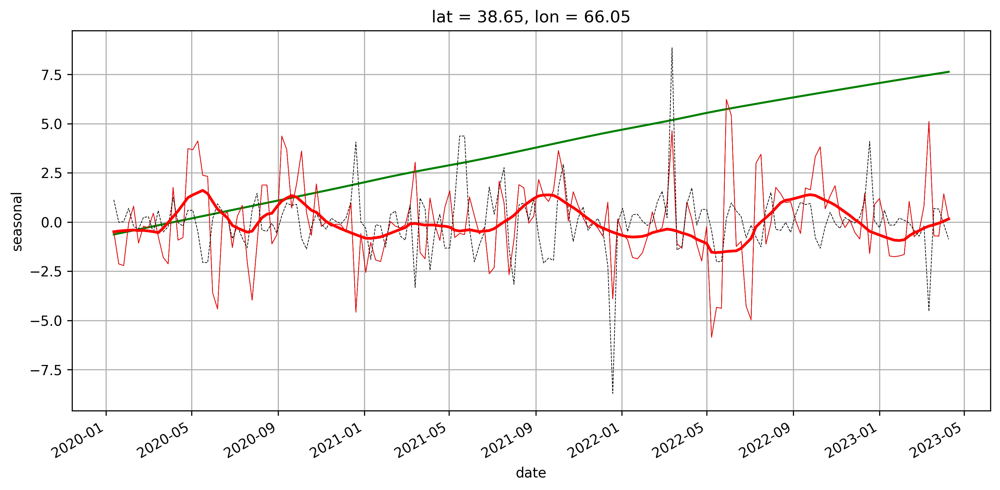

In [ ]:
idx1 = 400
idx2 = 400
trend = model.trend[idx1,idx2,:]
seasonal = model.seasonal[idx1,idx2,:]
resid = model.resid[idx1,idx2,:]

fig = plt.figure(figsize=(12,5), dpi=300)
seasonal.plot(c='black', lw=0.5)
trend.plot(c='green')
(seasonal).plot(c='red', lw=0.5)
resid.plot(c='black', ls='--', lw=0.5)
seasonal\
    .rolling(date=9, center=True, min_periods=1).median()\
    .rolling(date=9, center=True, min_periods=1).mean()\
    .plot(c='red', lw=2)

plt.grid()
plt.show()

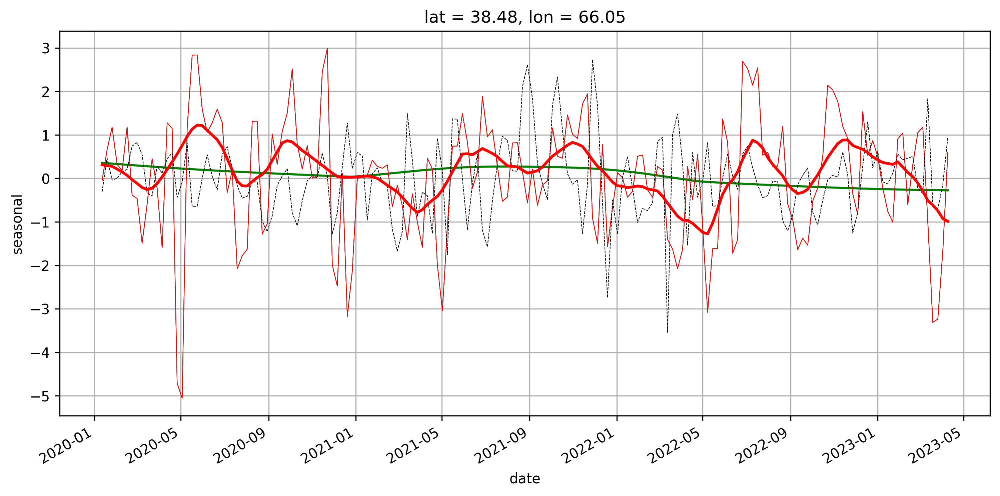

In [ ]:
idx1 = 200
idx2 = 400
trend = model.trend[idx1,idx2,:]
seasonal = model.seasonal[idx1,idx2,:]
resid = model.resid[idx1,idx2,:]

fig = plt.figure(figsize=(12,5), dpi=300)
seasonal.plot(c='black', lw=0.5)
trend.plot(c='green')
(seasonal).plot(c='red', lw=0.5)
resid.plot(c='black', ls='--', lw=0.5)
seasonal\
    .rolling(date=9, center=True, min_periods=1).median()\
    .rolling(date=9, center=True, min_periods=1).mean()\
    .plot(c='red', lw=2)

plt.grid()
plt.show()

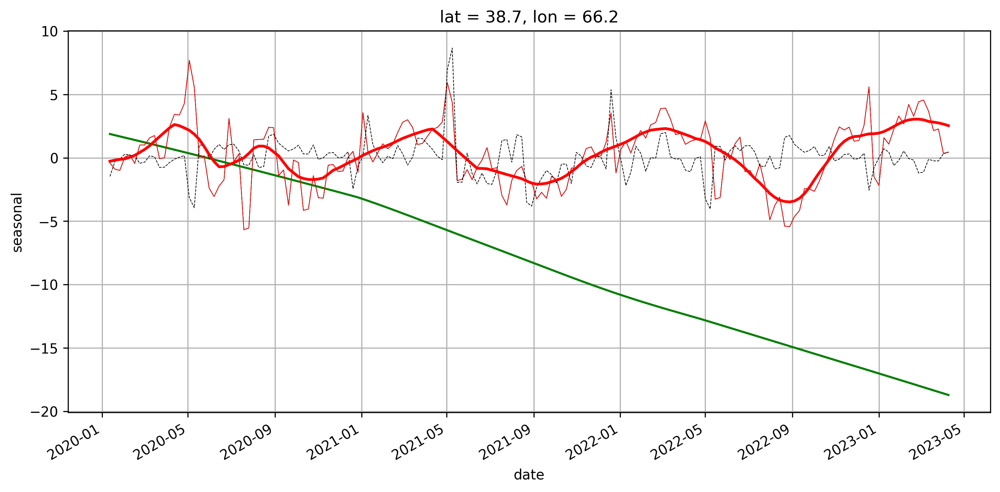

In [ ]:
lat = 38.7
lon = 66.2
trend = model.trend.sel(lat=lat, lon=lon, method='nearest')
seasonal = model.seasonal.sel(lat=lat, lon=lon, method='nearest')
resid = model.resid.sel(lat=lat, lon=lon, method='nearest')

fig = plt.figure(figsize=(12,5), dpi=300)
seasonal.plot(c='black', lw=0.5)
trend.plot(c='green')
(seasonal).plot(c='red', lw=0.5)
resid.plot(c='black', ls='--', lw=0.5)
seasonal\
    .rolling(date=9, center=True, min_periods=1).median()\
    .rolling(date=9, center=True, min_periods=1).mean()\
    .plot(c='red', lw=2)

plt.grid()
plt.show()

In [ ]:
seasonal = model.seasonal\
    .rolling(date=9, center=True, min_periods=1).median()\
    .rolling(date=9, center=True, min_periods=1).mean()
seasonal

<xarray.DataArray 'seasonal' (lat: 579, lon: 1341, date: 170)>
dask.array<truediv, shape=(579, 1341, 170), dtype=float32, chunksize=(256, 256, 13), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 2020-01-12 2020-01-19 ... 2023-04-09
  * lat      (lat) float64 38.31 38.31 38.31 38.31 ... 38.79 38.79 38.79 38.79
  * lon      (lon) float64 65.71 65.71 65.72 65.72 ... 66.83 66.83 66.83 66.83

In [ ]:
%%time

seasonal_amp = (seasonal.max(['date']) - seasonal.min('date')).compute()
seasonal_amp

/opt/homebrew/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/opt/homebrew/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/opt/homebrew/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/opt/homebrew/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/opt/homebrew/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/opt/homebrew/lib/python3.10/site-packages/numpy/lib/nanfunc

CPU times: user 30.7 s, sys: 3.81 s, total: 34.5 s
Wall time: 2min 12s


<xarray.DataArray 'seasonal' (lat: 579, lon: 1341)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * lat      (lat) float64 38.31 38.31 38.31 38.31 ... 38.79 38.79 38.79 38.79
  * lon      (lon) float64 65.71 65.71 65.72 65.72 ... 66.83 66.83 66.83 66.83

In [ ]:
%%time

years = ((model.date.max() - model.date.min()).dt.days/365.25).item()
print ('years', years)
velocity = ((model.trend.isel(date=-1) - model.trend.isel(date=0))/years).compute()

years 3.238877481177276
CPU times: user 188 ms, sys: 34.8 ms, total: 223 ms
Wall time: 1.67 s


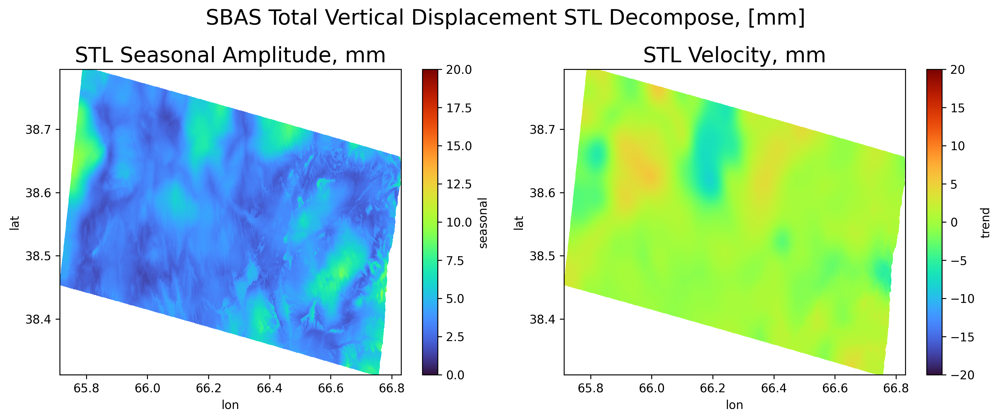

CPU times: user 1.27 s, sys: 60 ms, total: 1.33 s
Wall time: 722 ms


In [ ]:
%%time

fig = plt.figure(figsize=(12,5), dpi=300)

ax = fig.add_subplot(1, 2, 1)
seasonal_amp.plot.imshow(cmap='turbo', vmin=0, vmax=20, ax=ax)
ax.set_title('STL Seasonal Amplitude, mm', fontsize=18)

ax = fig.add_subplot(1, 2, 2)
velocity.plot.imshow(cmap='turbo', vmin=-20, vmax=20, ax=ax)
ax.set_title('STL Velocity, mm', fontsize=18)

plt.suptitle('SBAS Total Vertical Displacement STL Decompose, [mm]', fontsize=18)
plt.tight_layout()
plt.show()

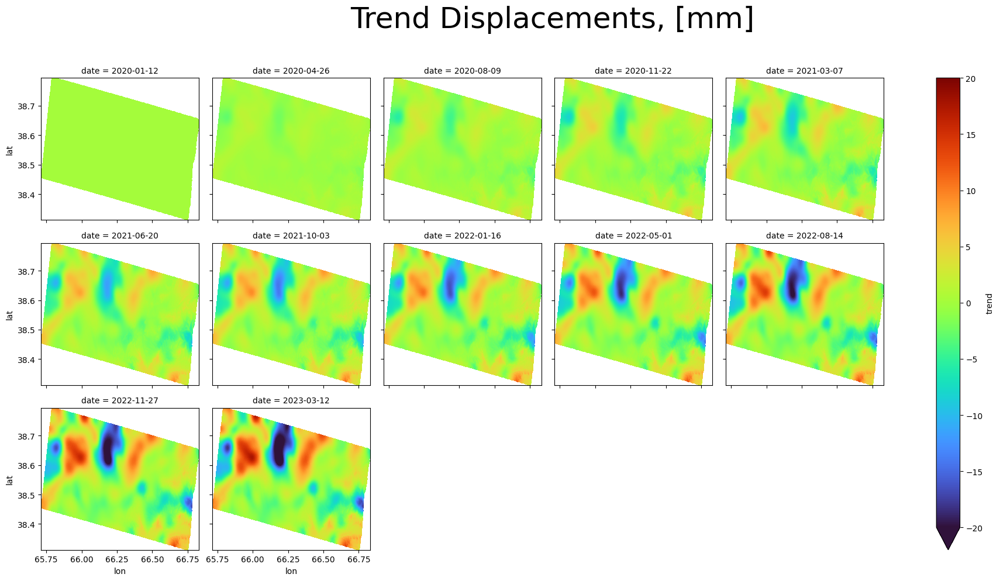

In [ ]:
# assume 1st grid has zero trend; show every Nth grid
fg = (model.trend[...,::15] - model.trend.isel(date=0)).plot.imshow(
    col='date',
    col_wrap=5, size=3, aspect=1.2,
    cmap='turbo', vmin=-20, vmax=20
)
fg.set_ticks(max_xticks=5, max_yticks=5, fontsize='medium')
fg.fig.suptitle('Trend Displacements, [mm]', y=1.1, fontsize=36)
#plt.savefig(f'Unwrapped Phase, [rad].jpg', dpi=150, quality=95)
plt.show()

## Export to VTK

In [ ]:
import rioxarray as rio
import pyvista as pv

In [ ]:
# open the 3D model
model = sbas.open_model('stl', chunksize=256)
model

<xarray.Dataset>
Dimensions:   (date: 170, lat: 579, lon: 1341)
Coordinates:
  * date      (date) datetime64[ns] 2020-01-12 2020-01-19 ... 2023-04-09
  * lat       (lat) float64 38.31 38.31 38.31 38.31 ... 38.79 38.79 38.79 38.79
  * lon       (lon) float64 65.71 65.71 65.72 65.72 ... 66.83 66.83 66.83 66.83
Data variables:
    resid     (lat, lon, date) float32 dask.array<chunksize=(256, 256, 1), meta=np.ndarray>
    seasonal  (lat, lon, date) float32 dask.array<chunksize=(256, 256, 1), meta=np.ndarray>
    trend     (lat, lon, date) float32 dask.array<chunksize=(256, 256, 1), meta=np.ndarray>

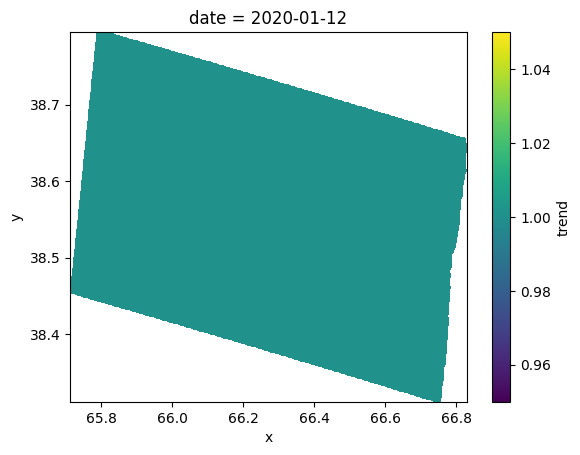

In [ ]:
validmask = xr.where(~np.isnan(model.trend.isel(date=0)),1,np.nan).rename({'lat': 'y', 'lon': 'x'})
validmask.plot()

In [ ]:
dem = sbas.get_dem().rename({'lat': 'y', 'lon': 'x'})\
    .interp_like(validmask, method='nearest').where(~np.isnan(validmask))
del dem['date']
dem

<xarray.DataArray 'z' (y: 579, x: 1341)>
dask.array<where, shape=(579, 1341), dtype=float32, chunksize=(256, 256), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 65.71 65.71 65.72 65.72 ... 66.83 66.83 66.83 66.83
  * y        (y) float64 38.31 38.31 38.31 38.31 ... 38.79 38.79 38.79 38.79
Attributes:
    long_name:     z
    actual_range:  [ 270.28479004 3202.47900391]

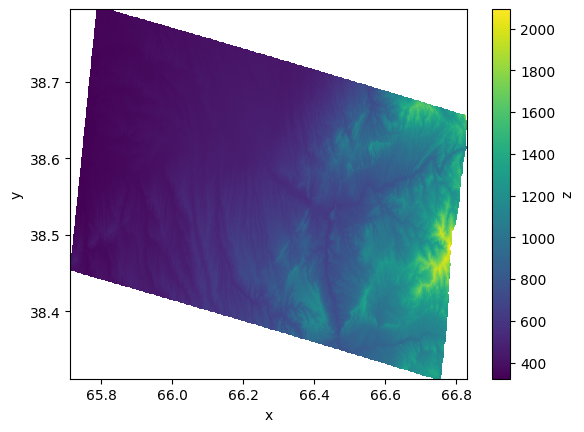

In [ ]:
dem.plot()

In [ ]:
basemap = rio.open_rasterio('basemap_googlesatellite.tif')\
    .rename('colors').interp_like(validmask, method='nearest').astype(np.uint8)
basemap

<xarray.DataArray 'colors' (band: 4, y: 579, x: 1341)>
array([[[133, 132, 126, ..., 229, 181, 177],
        [130, 131, 132, ..., 214, 190, 182],
        [127, 129, 133, ..., 174, 168, 168],
        ...,
        [125, 112,  75, ...,  80, 110, 151],
        [116,  94,  64, ..., 108, 138, 126],
        [101, 101,  84, ..., 129, 139, 153]],

       [[131, 130, 124, ..., 214, 168, 164],
        [128, 129, 130, ..., 199, 177, 170],
        [125, 127, 131, ..., 159, 155, 156],
        ...,
        [132, 118,  81, ...,  80, 108, 145],
        [124, 102,  72, ..., 107, 135, 120],
        [109, 109,  91, ..., 127, 134, 146]],

       [[110, 109, 103, ..., 193, 146, 144],
        [107, 108, 109, ..., 178, 155, 148],
        [104, 106, 110, ..., 138, 133, 133],
        ...,
        [109,  97,  61, ...,  62,  86, 120],
        [101,  81,  51, ...,  88, 113,  94],
        [ 88,  88,  71, ..., 106, 111, 119]],

       [[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]]], dtype=uint8)
Coordinates:
  * band         (band) int64 1 2 3 4
    spatial_ref  int64 0
  * x            (x) float64 65.71 65.71 65.72 65.72 ... 66.83 66.83 66.83 66.83
  * y            (y) float64 38.31 38.31 38.31 38.31 ... 38.79 38.79 38.79 38.79
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0

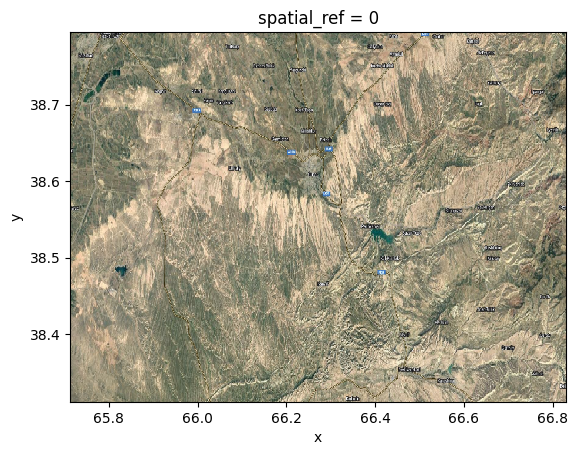

In [ ]:
basemap.plot.imshow()

In [ ]:
overlay = rio.open_rasterio('basemap_googlesatellite.tif')\
    .rename('colors').astype(np.uint8)
overlay

<xarray.DataArray 'colors' (band: 4, y: 1103, x: 1826)>
array([[[126, 123, 154, ...,  74,  75,  66],
        [120, 128, 133, ...,  87,  88,  76],
        [121, 132, 135, ...,  87,  83,  79],
        ...,
        [172, 190, 215, ..., 174,  89, 159],
        [167, 206, 226, ..., 165,  98, 132],
        [188, 211, 212, ..., 123, 178,  61]],

       [[134, 129, 160, ...,  90,  92,  83],
        [125, 132, 136, ..., 110, 112, 100],
        [125, 135, 136, ..., 111, 108, 105],
        ...,
        [152, 169, 191, ..., 158,  72, 142],
        [148, 185, 200, ..., 149,  83, 117],
        [170, 189, 184, ..., 106, 164,  47]],

       [[112, 108, 139, ...,  69,  69,  59],
        [102, 110, 113, ...,  84,  86,  74],
        [101, 112, 111, ...,  85,  81,  77],
        ...,
        [125, 141, 162, ..., 125,  43, 116],
        [123, 158, 173, ..., 116,  50,  84],
        [145, 162, 159, ...,  75, 129,  10]],

       [[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]]], dtype=uint8)
Coordinates:
  * band         (band) int64 1 2 3 4
  * x            (x) float64 65.45 65.45 65.45 65.45 ... 66.97 66.97 66.97 66.97
  * y            (y) float64 39.01 39.01 39.01 39.01 ... 38.09 38.09 38.09 38.09
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0

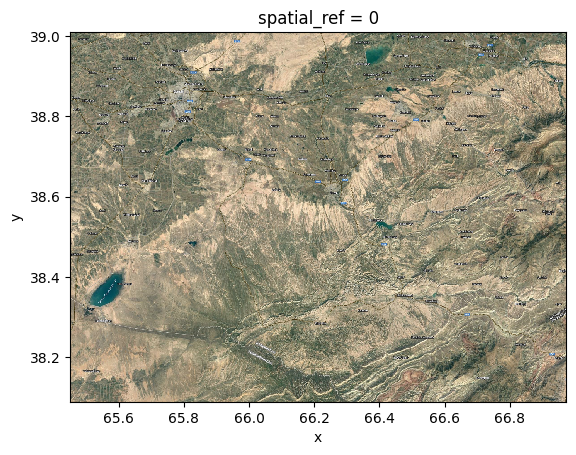

In [ ]:
overlay.plot.imshow()

### Static Model

In [ ]:
vtk_ugrid = NCubeVTK.ImageOnTopography(xr.merge([dem, basemap]))
vtk_ugrid = pv.UnstructuredGrid(vtk_ugrid)
vtk_ugrid.save('dem.vtk')
vtk_ugrid

UnstructuredGrid (0x2a2e4f520)
  N Cells:    533132
  N Points:   535071
  X Bounds:   6.571e+01, 6.683e+01
  Y Bounds:   3.831e+01, 3.879e+01
  Z Bounds:   3.228e+02, 2.093e+03
  N Arrays:   2

In [ ]:
vtk_ugrid = NCubeVTK.ImageOnTopography(xr.merge([dem, basemap]))
vtk_ugrid = pv.UnstructuredGrid(vtk_ugrid)
vtk_ugrid.save('dem.vtk')
vtk_ugrid

UnstructuredGrid (0x2a2e00220)
  N Cells:    533132
  N Points:   535071
  X Bounds:   6.571e+01, 6.683e+01
  Y Bounds:   3.831e+01, 3.879e+01
  Z Bounds:   3.228e+02, 2.093e+03
  N Arrays:   2

In [ ]:
dem_overlay = xr.zeros_like(dem.reindex_like(overlay))
vtk_ugrid = NCubeVTK.ImageOnTopography(xr.merge([dem_overlay, overlay]))
vtk_ugrid = pv.UnstructuredGrid(vtk_ugrid)
vtk_ugrid.save('overlay.vtk')
vtk_ugrid

UnstructuredGrid (0x2a5b05de0)
  N Cells:    2011150
  N Points:   2014078
  X Bounds:   6.545e+01, 6.697e+01
  Y Bounds:   3.809e+01, 3.901e+01
  Z Bounds:   0.000e+00, 0.000e+00
  N Arrays:   2

In [ ]:
vtk_ugrid = NCubeVTK.ImageOnTopography(xr.merge([dem, velocity, basemap]))
vtk_ugrid = pv.UnstructuredGrid(vtk_ugrid)
vtk_ugrid.save('velocity.vtk')
vtk_ugrid

UnstructuredGrid (0x2a9a7a980)
  N Cells:    533132
  N Points:   535071
  X Bounds:   6.571e+01, 6.683e+01
  Y Bounds:   3.831e+01, 3.879e+01
  Z Bounds:   3.228e+02, 2.093e+03
  N Arrays:   3

### Dynamic Seasonal Model

## Done

Export completed and the results can be used in other software and documents.